In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from pathlib import ntpath

In [2]:
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv('driving_log.csv', names = columns)
pd.set_option('display.max_colwidth', -1)
data.head()

C:\Users\aky\AppData\Local\Temp\ipykernel_8104\3661993260.py:3: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\aky\Documents\IMG\center_2024_09_11_14_19_31_485.jpg,C:\Users\aky\Documents\IMG\left_2024_09_11_14_19_31_485.jpg,C:\Users\aky\Documents\IMG\right_2024_09_11_14_19_31_485.jpg,0.0,0.0,0,0.000081
1,C:\Users\aky\Documents\IMG\center_2024_09_11_14_19_31_588.jpg,C:\Users\aky\Documents\IMG\left_2024_09_11_14_19_31_588.jpg,C:\Users\aky\Documents\IMG\right_2024_09_11_14_19_31_588.jpg,0.0,0.0,0,0.000078
2,C:\Users\aky\Documents\IMG\center_2024_09_11_14_19_31_688.jpg,C:\Users\aky\Documents\IMG\left_2024_09_11_14_19_31_688.jpg,C:\Users\aky\Documents\IMG\right_2024_09_11_14_19_31_688.jpg,0.0,0.0,0,0.000080
3,C:\Users\aky\Documents\IMG\center_2024_09_11_14_19_31_791.jpg,C:\Users\aky\Documents\IMG\left_2024_09_11_14_19_31_791.jpg,C:\Users\aky\Documents\IMG\right_2024_09_11_14_19_31_791.jpg,0.0,0.0,0,0.000078
4,C:\Users\aky\Documents\IMG\center_2024_09_11_14_19_31_894.jpg,C:\Users\aky\Documents\IMG\left_2024_09_11_14_19_31_894.jpg,C:\Users\aky\Documents\IMG\right_2024_09_11_14_19_31_894.jpg,0.0,0.0,0,0.000079


In [3]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_09_11_14_19_31_485.jpg,left_2024_09_11_14_19_31_485.jpg,right_2024_09_11_14_19_31_485.jpg,0.0,0.0,0,0.000081
1,center_2024_09_11_14_19_31_588.jpg,left_2024_09_11_14_19_31_588.jpg,right_2024_09_11_14_19_31_588.jpg,0.0,0.0,0,0.000078
2,center_2024_09_11_14_19_31_688.jpg,left_2024_09_11_14_19_31_688.jpg,right_2024_09_11_14_19_31_688.jpg,0.0,0.0,0,0.000080
3,center_2024_09_11_14_19_31_791.jpg,left_2024_09_11_14_19_31_791.jpg,right_2024_09_11_14_19_31_791.jpg,0.0,0.0,0,0.000078
4,center_2024_09_11_14_19_31_894.jpg,left_2024_09_11_14_19_31_894.jpg,right_2024_09_11_14_19_31_894.jpg,0.0,0.0,0,0.000079


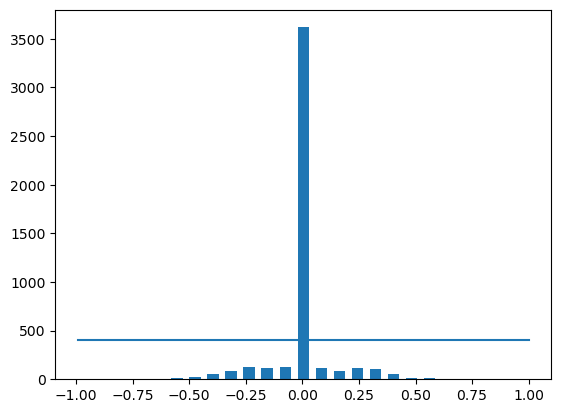

In [4]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [5]:

print('total data:', len(data))
print(data.shape)

total data: 4707
(4707, 7)


In [6]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 3218
remaining: 1489


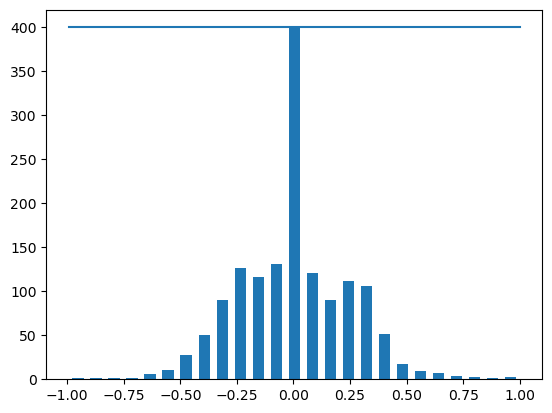

In [7]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [8]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [9]:
image_paths, steerings = load_img_steering('images', data)

In [10]:
len(image_paths)

4467

In [11]:
len(steerings)

4467

In [12]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))
     

Training Samples: 3573
Valid Samples: 894


Text(0.5, 1.0, 'Validation set')

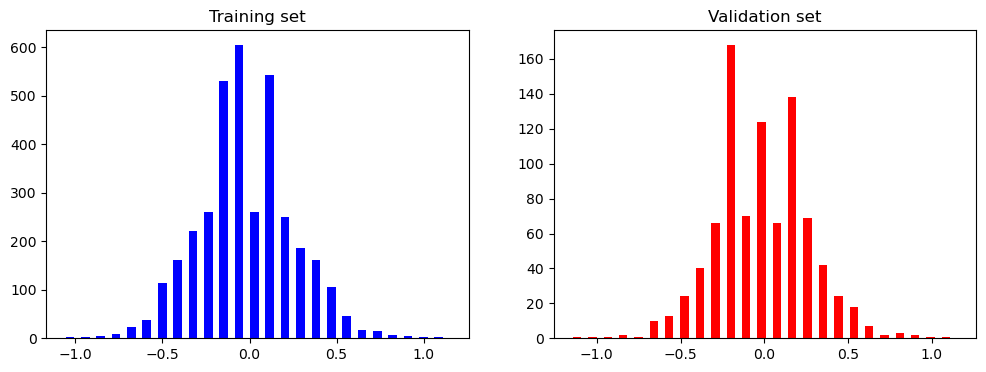

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

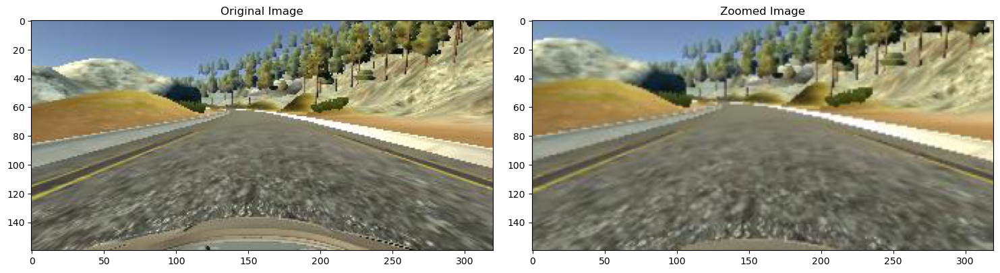

In [14]:
import random
from imgaug import augmenters as iaa
def zoom(image):
  zoomed_image = iaa.Affine(scale=(1, 1.3))
  image = zoomed_image.augment_image(image)
  return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')


Text(0.5, 1.0, 'Panned Image')

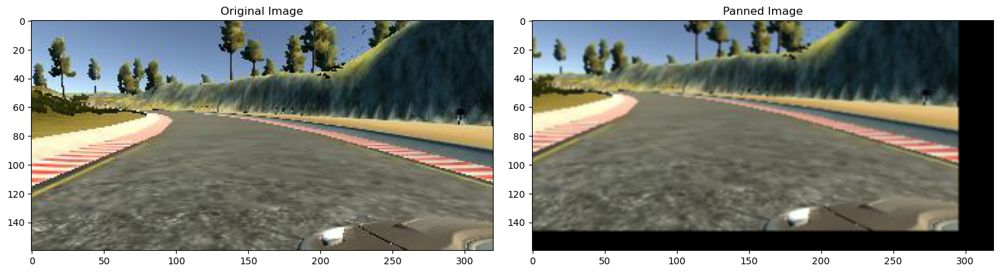

In [15]:
def tramslate(image):
  tramslate = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = tramslate.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = tramslate(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

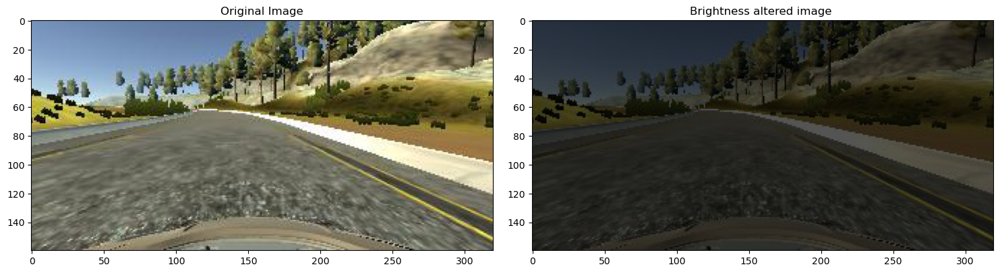

In [16]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)


fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ') 

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.12022649999999999')

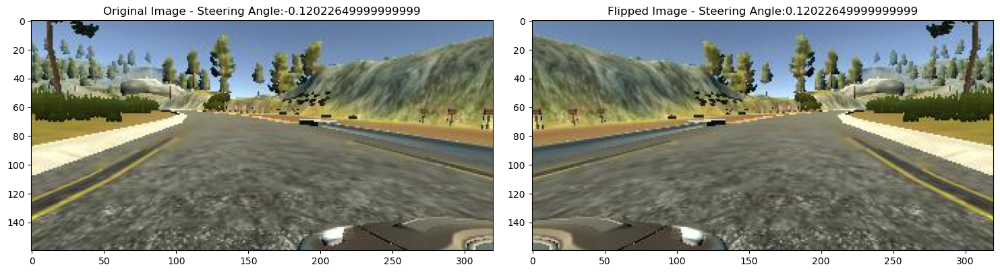

In [17]:
import cv2
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [18]:
def random_augment(image, steering_angle):
    image = plt.imread(image)
    if np.random.rand() < 0.5:
      image = tramslate(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

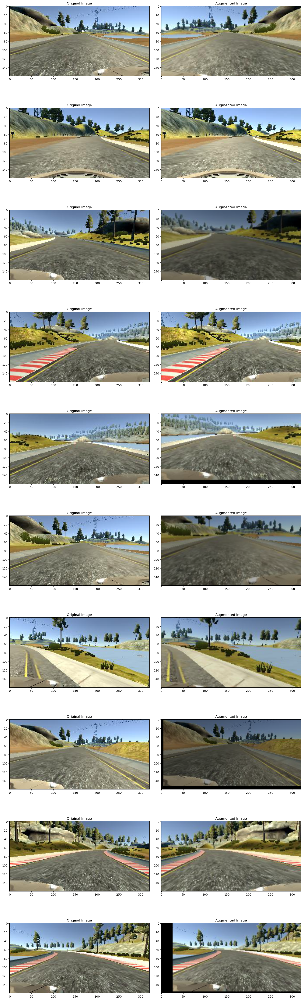

In [19]:
ncol = 2
nrow = 10
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
import matplotlib.pyplot as plt
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [20]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200,66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

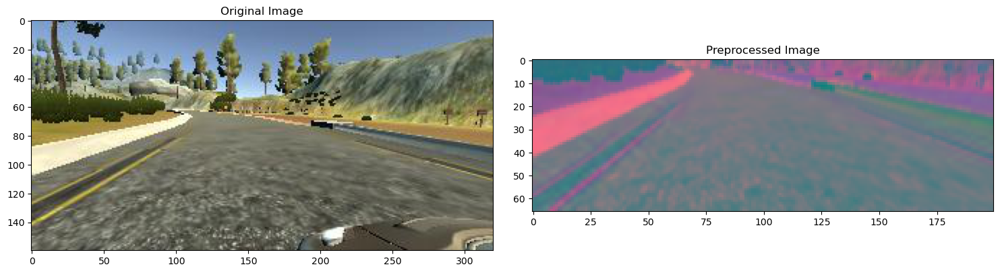

In [21]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [22]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

In [23]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

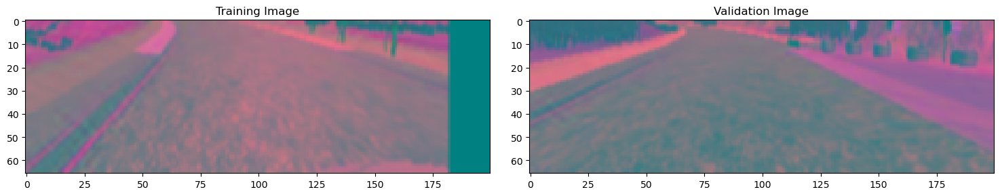

In [24]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [25]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(200, 66, 3), activation='relu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='relu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='relu'))
  model.add(Conv2D(64, (5, 5), activation='relu'))
  model.add(Flatten())
  model.add(Dense(100, activation = 'relu'))
  model.add(Dense(50, activation = 'relu'))
  model.add(Dense(10, activation = 'relu'))
  model.add(Dense(1))
  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mean_squared_error', optimizer=optimizer)
  return model

model = nvidia_model()
print(model.summary())

C:\ProgramData\anaconda3\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 98, 31, 24)          │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 47, 14, 36)          │          21,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 22, 5, 48)           │          43,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 18, 1, 64)           │          76,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 100)                 │         115,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │             510 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 264,443 (1.01 MB)

 Trainable params: 264,443 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

None


In [27]:
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 155s 518ms/step - loss: 0.0439 - val_loss: 0.0309
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 144s 482ms/step - loss: 0.0381 - val_loss: 0.0296
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 164s 547ms/step - loss: 0.0353 - val_loss: 0.0287
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 145s 484ms/step - loss: 0.0317 - val_loss: 0.0271
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 147s 493ms/step - loss: 0.0320 - val_loss: 0.0265
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 142s 475ms/step - loss: 0.0306 - val_loss: 0.0263
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 137s 456ms/step - loss: 0.0298 - val_loss: 0.0258
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 161s 539ms/step - loss: 0.0291 - val_loss: 0.0250
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 145s 484ms/step - loss: 0.0284 - val_loss: 0.0249
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 150s 500ms/step - loss: 0.0281 - val_loss: 0.0237


Text(0.5, 0, 'Epoch')

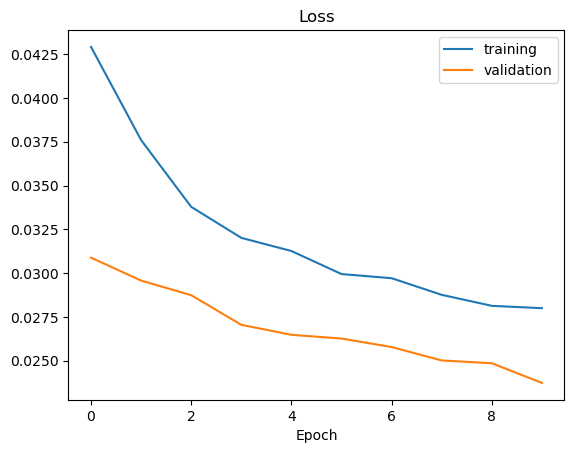

In [28]:

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')


In [29]:
model.save('model2.h5')